## Preliminary Description

### The dataset called "Thyroid cancer risk" consists of 212,691 instances, a set of 16 attributes, and one class, which describes the risk factors for thyroid cancer.

In [2]:
import pandas as pd

df= pd.read_csv('thyroid_cancer_risk_data.csv')
print(df.head())

   Patient_ID  Age  Gender  Country  Ethnicity Family_History  \
0           1   66    Male   Russia  Caucasian             No   
1           2   29    Male  Germany   Hispanic             No   
2           3   86    Male  Nigeria  Caucasian             No   
3           4   75  Female    India      Asian             No   
4           5   35  Female  Germany    African            Yes   

  Radiation_Exposure Iodine_Deficiency Smoking Obesity Diabetes  TSH_Level  \
0                Yes                No      No      No       No       9.37   
1                Yes                No      No      No       No       1.83   
2                 No                No      No      No       No       6.26   
3                 No                No      No      No       No       4.10   
4                Yes                No      No      No       No       9.10   

   T3_Level  T4_Level  Nodule_Size Thyroid_Cancer_Risk Diagnosis  
0      1.67      6.16         1.08                 Low    Benign  
1     

## Inspecting and Statistics

In [3]:
print(df.describe())

         Patient_ID            Age      TSH_Level       T3_Level  \
count  212691.00000  212691.000000  212691.000000  212691.000000   
mean   106346.00000      51.918497       5.045102       2.001727   
std     61398.74739      21.632815       2.860264       0.866248   
min         1.00000      15.000000       0.100000       0.500000   
25%     53173.50000      33.000000       2.570000       1.250000   
50%    106346.00000      52.000000       5.040000       2.000000   
75%    159518.50000      71.000000       7.520000       2.750000   
max    212691.00000      89.000000      10.000000       3.500000   

            T4_Level    Nodule_Size  
count  212691.000000  212691.000000  
mean        8.246204       2.503403  
std         2.164188       1.444631  
min         4.500000       0.000000  
25%         6.370000       1.250000  
50%         8.240000       2.510000  
75%        10.120000       3.760000  
max        12.000000       5.000000  


In [4]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 212691 entries, 0 to 212690
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Patient_ID           212691 non-null  int64  
 1   Age                  212691 non-null  int64  
 2   Gender               212691 non-null  object 
 3   Country              212691 non-null  object 
 4   Ethnicity            212691 non-null  object 
 5   Family_History       212691 non-null  object 
 6   Radiation_Exposure   212691 non-null  object 
 7   Iodine_Deficiency    212691 non-null  object 
 8   Smoking              212691 non-null  object 
 9   Obesity              212691 non-null  object 
 10  Diabetes             212691 non-null  object 
 11  TSH_Level            212691 non-null  float64
 12  T3_Level             212691 non-null  float64
 13  T4_Level             212691 non-null  float64
 14  Nodule_Size          212691 non-null  float64
 15  Thyroid_Cancer_Ri

In [5]:
print(df.shape)

(212691, 17)


## Visualizations

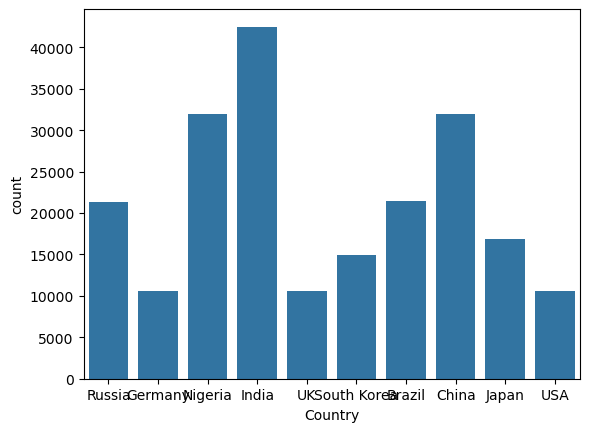

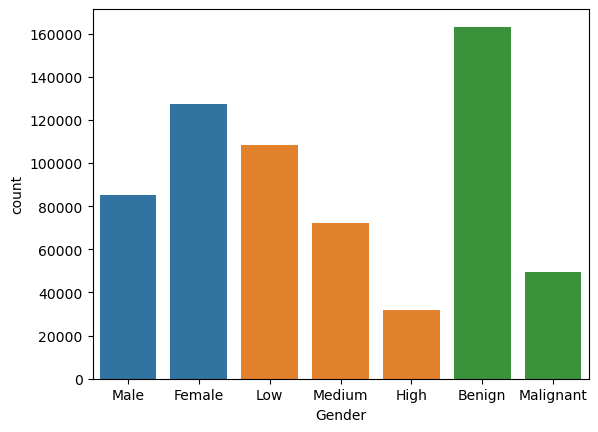

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.countplot(x='Country', data=df)
plt.show()

sns.countplot(x='Gender', data=df)
sns.countplot(x='Thyroid_Cancer_Risk', data=df)
sns.countplot(x='Diagnosis', data=df)
plt.show()

Age_range
16-30    45597
31-45    45505
61-75    45433
46-60    45380
+76      27990
0-15      2786
Name: count, dtype: int64
[45597 45505 45433 45380 27990  2786]
['16-30', '31-45', '61-75', '46-60', '+76', '0-15']


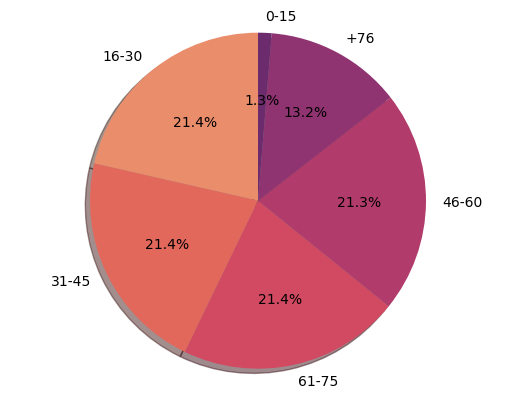

In [7]:
import numpy as np

age_bins = [0,15,31,47,63,79,np.inf]
age_labels = ["0-15", "16-30", "31-45","46-60", "61-75","+76"]
df["Age_range"] = pd.cut(df["Age"], labels=age_labels, bins=age_bins)
prep_ages = df["Age_range"].value_counts()
print(prep_ages)
print(prep_ages.to_numpy())
print(prep_ages.index.tolist() )

colors = sns.color_palette('flare')[0:6]
fig1, ax1 = plt.subplots()
ax1.pie(prep_ages.to_numpy(), labels=prep_ages.index.tolist(), autopct='%1.1f%%',colors=colors,shadow=True, startangle=90 )
ax1.axis('equal')
plt.show()

# Research questions 

## 1.- Which gender is more likely to have a malignant diagnosis?
### Alternative hypothesis: Women are more likely to have a malignant diagnosis.

   Gender  Diagnosis
0  Female      29740
1    Male      19755


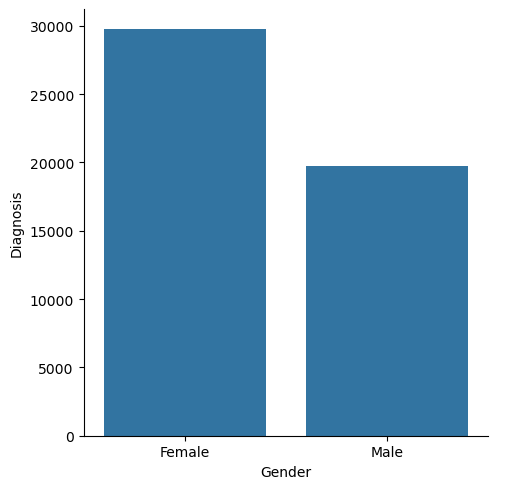

In [8]:
cancer = df[df["Diagnosis"] == 'Malignant'][["Gender", "Diagnosis"]].groupby("Gender").count().reset_index()

print(cancer)

sns.catplot(x="Gender", y="Diagnosis", 
            data=cancer, 
            kind="bar")
plt.show()

#### When generating the graph, it can be inferred that the hypothesis mentioned earlier is accepted

## 2.- Which ethnicity is more likely to be exposed to radiation?

### Alternative hypothesis: Asian ethnicities are more likely to be exposed to radiation  

        Ethnicity  Radiation_Exposure
0         African                6406
1           Asian                7890
2       Caucasian                9486
3        Hispanic                4813
4  Middle Eastern                3265


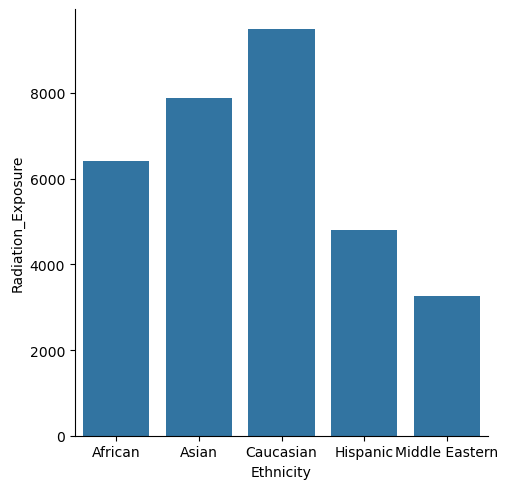

In [9]:
et_asian = df[df["Radiation_Exposure"] == 'Yes'][["Ethnicity", "Radiation_Exposure"]].groupby("Ethnicity").count().reset_index()

print(et_asian)

sns.catplot(x="Ethnicity", y="Radiation_Exposure", 
            data=et_asian, 
            kind="bar")
plt.show()

#### When generating the graph, it can be inferred that the hypothesis mentioned earlier is rejected, as the ethnicity most likely to be exposed to radiation is Caucasian

## 3.- Is there a relationship between nodule size and the values of TSH, T3, and T4?

### Alternative hypothesis: There is a relationship between nodule size and the values of TSH, T3, and T4

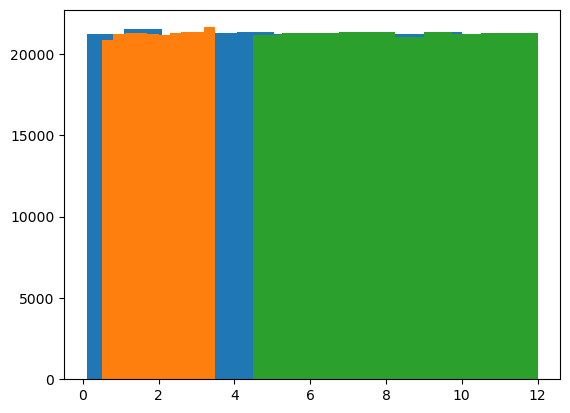

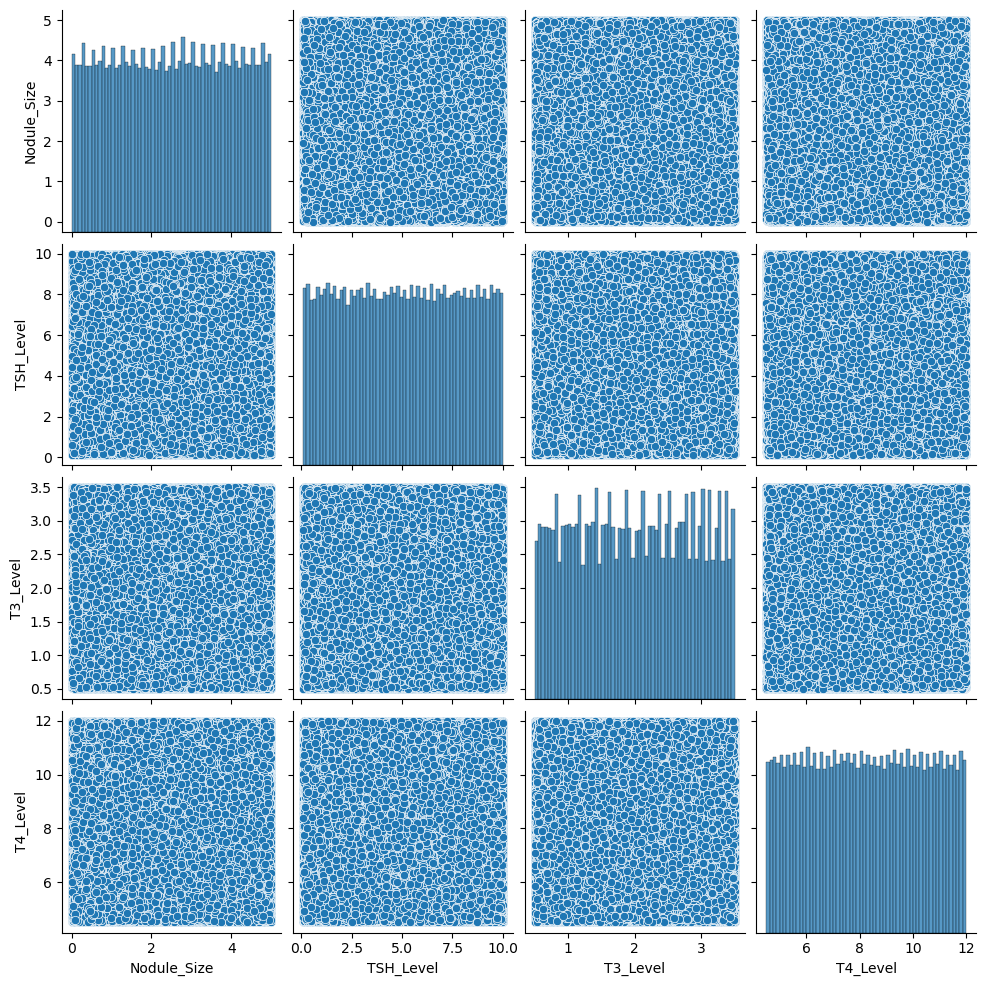

In [10]:
plt.hist(df["TSH_Level"])
plt.hist(df["T3_Level"])
plt.hist(df["T4_Level"])

df_graf = df[["Nodule_Size","TSH_Level","T3_Level","T4_Level" ]]
sns.pairplot(df_graf, kind="scatter")
plt.show()

Spearman rank correlation_TSH: 0.00042326133129820824
Spearman rank correlation_T3: -0.0017882902284609074
Spearman rank correlation_T4: -0.001861208177775653


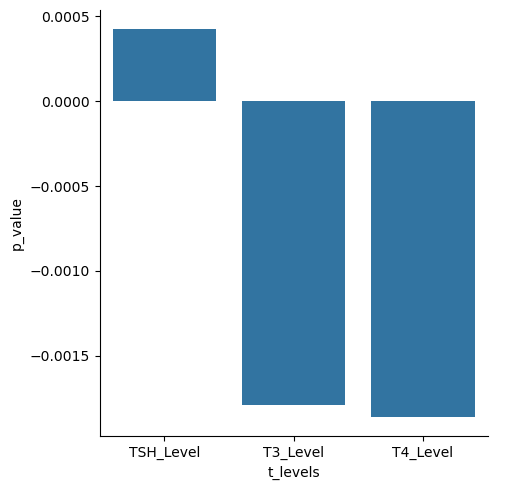

In [11]:
import scipy.stats as stats
corr_tsh = stats.spearmanr(df["Nodule_Size"], df["TSH_Level"]).statistic
print("Spearman rank correlation_TSH:", corr_tsh)

corr_t3 = stats.spearmanr(df["Nodule_Size"], df["T3_Level"]).statistic
print("Spearman rank correlation_T3:", corr_t3)

corr_t4 = stats.spearmanr(df["Nodule_Size"], df["T4_Level"]).statistic
print("Spearman rank correlation_T4:", corr_t4)


data_t_values = {'t_levels': ['TSH_Level', 'T3_Level', 'T4_Level'],
        'p_value': [corr_tsh, corr_t3, corr_t4]}

df_t_values = pd.DataFrame(data_t_values)

sns.catplot(x="t_levels", y="p_value", 
            data=df_t_values, 
            kind="bar")
plt.show()

import plotly.express as px
fig = px.scatter(x=df["TSH_Level"], y=df["Nodule_Size"])
fig.show()

### When generating the graph, it can be inferred that the hypothesis mentioned earlier is rejected, as there is no relationship between the variables

## 4.- What age group has the highest prevalence of malignant diagnosis?

### Alternative hypothesis: The age range most likely to have a malignant diagnosis is 46-60

  Age_range  Diagnosis
0      0-15        622
1     16-30      10620
2     31-45      10539
3     46-60      10584
4     61-75      10657
5       +76       6473


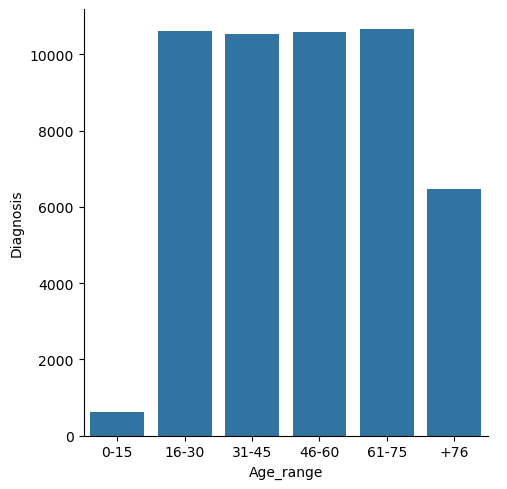

In [15]:
cancer_age = df[df["Diagnosis"] == 'Malignant'][["Age_range", "Diagnosis"]].groupby("Age_range", observed=False).count().reset_index()

print(cancer_age)

sns.catplot(x="Age_range", y="Diagnosis", 
            data=cancer_age, 
            kind="bar")
plt.show()


### When generating the graph, it can be inferred that the hypothesis mentioned earlier is rejected, as there is no significant prevalence in any specific age range

## 5.- Are women with a family history more likely to have a malignant diagnosis?

### Alternative hypothesis: Women with a family history are more likely to have a malignant diagnosis

  Family_History  Diagnosis
0             No      28838
1            Yes      20657


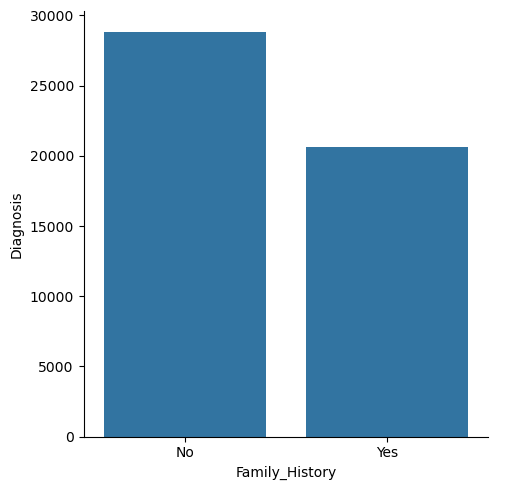

In [16]:
cancer_fam = df[df["Diagnosis"] == 'Malignant'][["Family_History", "Diagnosis"]].groupby("Family_History").count().reset_index()

print(cancer_fam)

sns.catplot(x="Family_History", y="Diagnosis", 
            data=cancer_fam, 
            kind="bar")
plt.show()

### When generating the graph, it can be inferred that the hypothesis mentioned earlier is rejected, as there is no relationship, even if there is a family history

## 6.- Is there a relationship between high cancer risk and the variables smoking, obesity, and diabetes?

### Alternative hypothesis: There is no relationship between smoking, obesity, and diabetes with having a high cancer risk.

  Smoking  Thyroid_Cancer_Risk
0      No                25534
1     Yes                 6369
  Obesity  Thyroid_Cancer_Risk
0      No                22430
1     Yes                 9473
  Diabetes  Thyroid_Cancer_Risk
0       No                25497
1      Yes                 6406


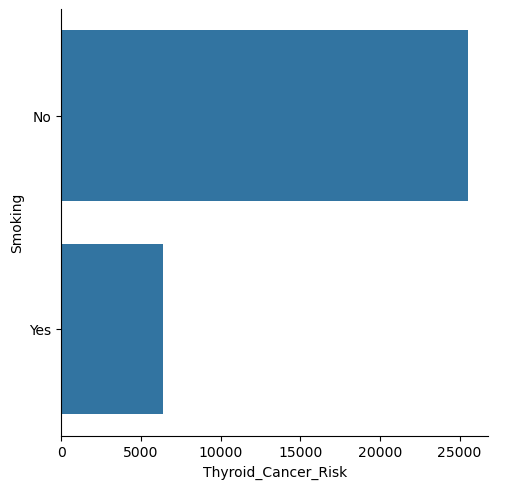

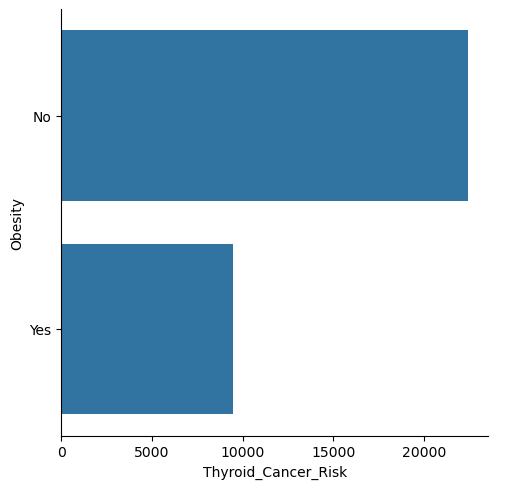

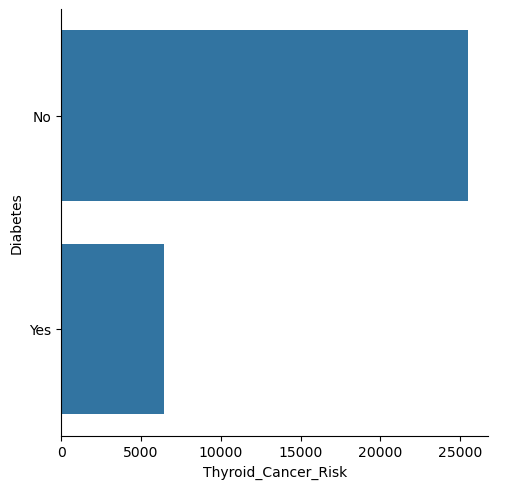

In [17]:
risk_smok = df[df["Thyroid_Cancer_Risk"] == 'High'][["Smoking","Thyroid_Cancer_Risk"]].groupby("Smoking").count().reset_index()
print(risk_smok)

risk_obe = df[df["Thyroid_Cancer_Risk"] == 'High'][["Obesity","Thyroid_Cancer_Risk"]].groupby("Obesity").count().reset_index()
print(risk_obe)

risk_dia = df[df["Thyroid_Cancer_Risk"] == 'High'][["Diabetes","Thyroid_Cancer_Risk"]].groupby("Diabetes").count().reset_index()
print(risk_dia)

sns.catplot(x="Thyroid_Cancer_Risk", y="Smoking", 
            data=risk_smok, 
            kind="bar")
sns.catplot(x="Thyroid_Cancer_Risk", y="Obesity", 
            data=risk_obe, 
            kind="bar")
sns.catplot(x="Thyroid_Cancer_Risk", y="Diabetes", 
            data=risk_dia, 
            kind="bar")
plt.show()

### When generating the graph, it can be inferred that the hypothesis mentioned earlier is accepted

### Conclusion: After answering the hypothesis questions, several points can be deduced, such as:
- Women are more likely to develop thyroid cancer.
- There is no specific age range that is more likely to have a malignant diagnosis.
- Family history is not related to having a cancer diagnosis.
- There is no relationship between having a high cancer risk and conditions such as obesity, diabetes, or smoking.